# HDF5 Simulation Results Visualization

This notebook provides comprehensive visualization tools for HDF5 thermal and activation data from DED simulations.

It just a tool to visualitze the result saved in h5 file.

**Features:**
- Load and inspect HDF5 thermal fields and activation volumes
- Visualize temperature distributions with existing `ThermalPlotter`
- 3D visualization of activation volumes with `VoxelVisualizer`
- Time evolution analysis
- Combined thermal + activation views

**Requirements:**
```bash
pip install h5py numpy matplotlib plotly
```
## RHINGS TO DO:
1. CONFIGURE H5 AND ACTIVATION_HDF5 FILE PATHS
2.


## 1. Setup and Imports

In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import h5py

# Import HDF5 loading utilities
from callbacks.hdf5_thermal_saver import (
    load_thermal_field,
    load_thermal_metadata,
    list_steps_in_file as list_thermal_steps
)

from callbacks.hdf5_activation_saver import (
    load_activation_volume,
    load_activation_metadata,
    get_activation_statistics,
    list_steps_in_file as list_activation_steps
)

# Import existing visualization utilities
from utils.field_visualization import ThermalPlotter, MeltPoolDimensions
from utils.visualization_utils import plot_slice, plot_surface
from voxel.voxel_visualize import VoxelVisualizer

# Configure matplotlib for better quality
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10

print("All imports successful!")

All imports successful!


## 2. Configuration - Specify Your HDF5 Files

Update these paths to point to your HDF5 files from a simulation run.

In [4]:
# ============================================================================
# CONFIGURE THESE PATHS
# ============================================================================

# Example paths - update these to your actual files
THERMAL_HDF5 = r"_experiments\test_hdf5\job1761060334374087600_build20.0x20.0x15.0mm_part5.0x5.0x2.0mm_vox200.0um_dt200.0ms_v3.0mms_p600.0W_f2.0gmin\thermal_fields.h5"
ACTIVATION_HDF5 = r"_experiments\video_prod\job1761097539539272700_build30.0x30.0x20.0mm_part10.0x10.0x5.0mm_vox200.0um_dt100.0ms_v5.0mms_p800.0W_f3.0gmin\activation_volumes.h5"

# Material properties
MELTING_TEMP = 1700.0  # Kelvin
AMBIENT_TEMP = 300.0   # Kelvin

# Visualization settings
COLORMAP = 'hot'  # For thermal: 'hot', 'inferno', 'viridis'
TEMP_RANGE = (AMBIENT_TEMP, 2500.0)  # Temperature range for plotting

# ============================================================================

# Convert to Path objects
thermal_path = Path(THERMAL_HDF5)
activation_path = Path(ACTIVATION_HDF5)

# Check if files exist
if thermal_path.exists():
    print(f" Thermal HDF5 found: {thermal_path}")
else:
    print(f" Thermal HDF5 not found: {thermal_path}")
    print("  Please update THERMAL_HDF5 path above")

if activation_path.exists():
    print(f" Activation HDF5 found: {activation_path}")
else:
    print(f" Activation HDF5 not found: {activation_path}")
    print("  Please update ACTIVATION_HDF5 path above")

 Thermal HDF5 found: _experiments\test_hdf5\job1761060334374087600_build20.0x20.0x15.0mm_part5.0x5.0x2.0mm_vox200.0um_dt200.0ms_v3.0mms_p600.0W_f2.0gmin\thermal_fields.h5
 Activation HDF5 found: _experiments\video_prod\job1761097539539272700_build30.0x30.0x20.0mm_part10.0x10.0x5.0mm_vox200.0um_dt100.0ms_v5.0mms_p800.0W_f3.0gmin\activation_volumes.h5


## 3. Inspect HDF5 Files

Get an overview of what's stored in the files.

In [5]:
def inspect_hdf5_file(filepath, data_type="thermal"):
    """Print detailed information about HDF5 file."""
    print(f"\n{'='*70}")
    print(f"HDF5 File: {filepath}")
    print(f"{'='*70}\n")
    
    if not filepath.exists():
        print("✗ File not found!")
        return
    
    # File size
    file_size_mb = filepath.stat().st_size / (1024 * 1024)
    print(f"File size: {file_size_mb:.2f} MB\n")
    
    # List available steps
    if data_type == "thermal":
        steps = list_thermal_steps(str(filepath))
    else:
        steps = list_activation_steps(str(filepath))
    
    print(f"Available timesteps: {len(steps)}")
    print(f"  First step: {steps[0]}")
    print(f"  Last step: {steps[-1]}")
    print(f"  All steps: {steps}\n")
    
    # Load first timestep to get data shape and metadata
    first_step = steps[0]
    
    if data_type == "thermal":
        data = load_thermal_field(str(filepath), step=first_step)
        metadata = load_thermal_metadata(str(filepath), step=first_step)
        
        print(f"Temperature field shape: {data.shape}")
        print(f"Temperature range: {data.min():.1f} - {data.max():.1f} K\n")
    else:
        data = load_activation_volume(str(filepath), step=first_step)
        metadata = load_activation_metadata(str(filepath), step=first_step)
        
        print(f"Activation volume shape: {data.shape}")
        print(f"Activated voxels: {data.sum():,} / {data.size:,} ({100*data.sum()/data.size:.2f}%)\n")
    
    # Print metadata
    print("Metadata (first timestep):")
    for key, value in sorted(metadata.items()):
        if isinstance(value, float):
            print(f"  {key}: {value:.3f}")
        else:
            print(f"  {key}: {value}")
    
    print(f"\n{'='*70}\n")
    return steps, data.shape, metadata

# Inspect thermal file
if thermal_path.exists():
    thermal_steps, thermal_shape, thermal_meta = inspect_hdf5_file(thermal_path, "thermal")

# Inspect activation file
if activation_path.exists():
    activation_steps, activation_shape, activation_meta = inspect_hdf5_file(activation_path, "activation")


HDF5 File: _experiments\test_hdf5\job1761060334374087600_build20.0x20.0x15.0mm_part5.0x5.0x2.0mm_vox200.0um_dt200.0ms_v3.0mms_p600.0W_f2.0gmin\thermal_fields.h5

File size: 15.89 MB

Available timesteps: 4
  First step: 4
  Last step: 19
  All steps: [4, 9, 14, 19]

Temperature field shape: (100, 100, 75)
Temperature range: 300.0 - 2024.7 K

Metadata (first timestep):
  laser_power: 600.000
  layer: 0
  max_temp: 2024.677
  melt_pool_depth: 0.000
  melt_pool_width: 0.001
  position_x: 0.007
  position_y: 0.010
  position_z: 0.005
  powder_feed_rate: 0.000
  scan_speed: 0.003
  step: 4
  time: 0.800
  track: 0
  voxel_size_x: 0.000
  voxel_size_y: 0.000
  voxel_size_z: 0.000
  voxel_x: 36
  voxel_y: 47
  voxel_z: 25



HDF5 File: _experiments\video_prod\job1761097539539272700_build30.0x30.0x20.0mm_part10.0x10.0x5.0mm_vox200.0um_dt100.0ms_v5.0mms_p800.0W_f3.0gmin\activation_volumes.h5

File size: 0.23 MB

Available timesteps: 10
  First step: 9
  Last step: 99
  All steps: [9, 19, 29, 3

## 4. Thermal Field Visualization

Visualize temperature distributions using the existing `ThermalPlotter` utility.
###TODO:check consistency of code flow

### 4.1 Single Timestep - Multi-Plane View

c:\Users\hakim\Documents\ma_feature_representation_env\git\hypo-simulations\utils\field_visualization.py:231: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(
c:\Users\hakim\Documents\ma_feature_representation_env\git\hypo-simulations\utils\field_visualization.py:464: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc=legend_loc)


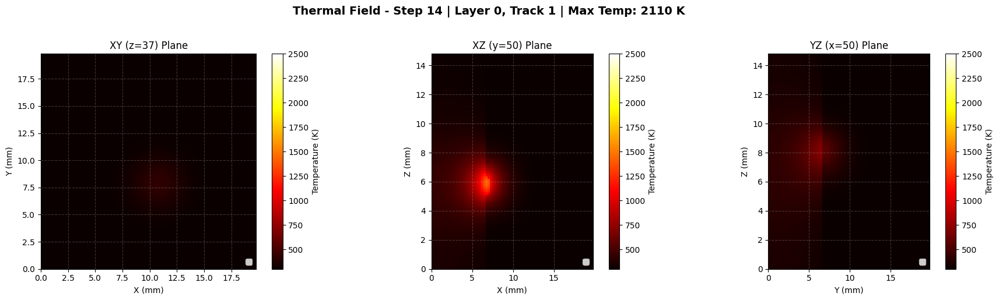

In [6]:
def visualize_thermal_field(filepath, step, voxel_size=(2e-4, 2e-4, 2e-4), 
                           melting_temp=1700, temp_range=None, cmap='hot'):
    """
    Visualize thermal field at a specific timestep using ThermalPlotter.
    
    Args:
        filepath: Path to HDF5 file
        step: Timestep to visualize
        voxel_size: Voxel dimensions (meters)
        melting_temp: Melting temperature (K)
        temp_range: (min, max) temperature for colorbar
        cmap: Colormap name
    """
    # Load data
    temp_field = load_thermal_field(str(filepath), step=step)
    metadata = load_thermal_metadata(str(filepath), step=step)
    
    # Get voxel size from metadata if available
    if 'voxel_size_x' in metadata:
        voxel_size = (metadata['voxel_size_x'], 
                     metadata['voxel_size_y'], 
                     metadata['voxel_size_z'])
    
    # Create ThermalPlotter
    plotter = ThermalPlotter(melting_temp=melting_temp, cmap=cmap, num_contours=40)
    
    # Get middle indices for slices
    nx, ny, nz = temp_field.shape
    mid_x = nx // 2
    mid_y = ny // 2
    mid_z = nz // 2
    
    # Create grids for each plane (in meters)
    x = np.arange(nx) * voxel_size[0]
    y = np.arange(ny) * voxel_size[1]
    z = np.arange(nz) * voxel_size[2]
    
    # Create figure with 3 subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    
    # XY plane (top view)
    X, Y = np.meshgrid(x, y, indexing='ij')
    temp_xy = temp_field[:, :, mid_z]
    plotter.plot_thermal_plane(
        ax=ax1,
        grid1=X, grid2=Y,
        temperatures=temp_xy,
        title=f'XY (z={mid_z})',
        xlabel='X', ylabel='Y',
        time=metadata.get('time', 0.0),
        speed=metadata.get('scan_speed', 0.0),
        temperature_range=temp_range,
        show_melt_pool=True,
        show_zero_kelvin=False,
        show_heat_source=False,
        show_powder_stream_boundary=False,
        plot_mode='pixel'
    )
    
    # XZ plane (front view)
    X, Z = np.meshgrid(x, z, indexing='ij')
    temp_xz = temp_field[:, mid_y, :]
    plotter.plot_thermal_plane(
        ax=ax2,
        grid1=X, grid2=Z,
        temperatures=temp_xz,
        title=f'XZ (y={mid_y})',
        xlabel='X', ylabel='Z',
        time=metadata.get('time', 0.0),
        speed=metadata.get('scan_speed', 0.0),
        temperature_range=temp_range,
        show_melt_pool=True,
        show_zero_kelvin=False,
        show_heat_source=False,
        show_powder_stream_boundary=False,
        plot_mode='pixel'
    )
    
    # YZ plane (side view)
    Y, Z = np.meshgrid(y, z, indexing='ij')
    temp_yz = temp_field[mid_x, :, :]
    plotter.plot_thermal_plane(
        ax=ax3,
        grid1=Y, grid2=Z,
        temperatures=temp_yz,
        title=f'YZ (x={mid_x})',
        xlabel='Y', ylabel='Z',
        time=metadata.get('time', 0.0),
        speed=metadata.get('scan_speed', 0.0),
        temperature_range=temp_range,
        show_melt_pool=True,
        show_zero_kelvin=False,
        show_heat_source=False,
        show_powder_stream_boundary=False,
        plot_mode='pixel'
    )
    
    # Add overall title with metadata
    layer = metadata.get('layer', 'N/A')
    track = metadata.get('track', 'N/A')
    max_temp = temp_field.max()
    fig.suptitle(f'Thermal Field - Step {step} | Layer {layer}, Track {track} | Max Temp: {max_temp:.0f} K',
                 fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    return fig

# Visualize thermal field at a specific step
if thermal_path.exists():
    # Choose which step to visualize (e.g., middle step)
    step_to_plot = thermal_steps[len(thermal_steps)//2] if len(thermal_steps) > 0 else thermal_steps[0]
    
    fig = visualize_thermal_field(
        thermal_path, 
        step=step_to_plot,
        melting_temp=MELTING_TEMP,
        temp_range=TEMP_RANGE,
        cmap=COLORMAP
    )
    plt.show()

### 4.2 Temperature Evolution Over Time

Processing 4 timesteps...
  1/4
✓ Processed 4 timesteps


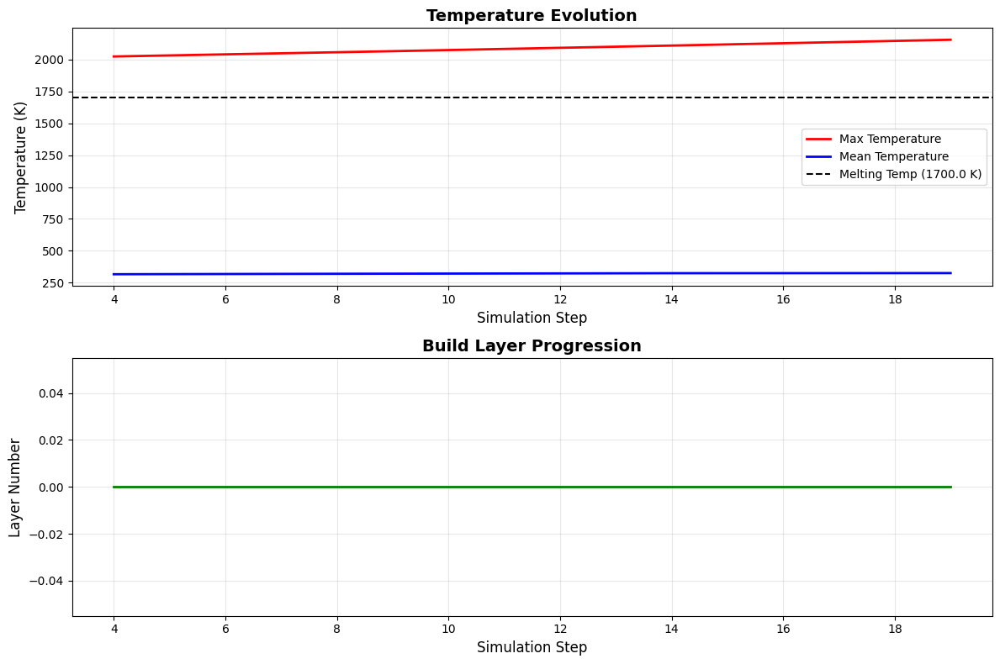

In [7]:
def plot_temperature_evolution(filepath, steps_to_sample=None):
    """
    Plot temperature statistics evolution over time.
    
    Args:
        filepath: Path to thermal HDF5 file
        steps_to_sample: Number of steps to sample (None = all)
    """
    steps = list_thermal_steps(str(filepath))
    
    # Sample steps if requested
    if steps_to_sample and steps_to_sample < len(steps):
        indices = np.linspace(0, len(steps)-1, steps_to_sample, dtype=int)
        steps = [steps[i] for i in indices]
    
    # Collect statistics
    max_temps = []
    mean_temps = []
    melt_pool_temps = []
    times = []
    layers = []
    
    print(f"Processing {len(steps)} timesteps...")
    for i, step in enumerate(steps):
        if i % 10 == 0:
            print(f"  {i+1}/{len(steps)}", end='\r')
        
        temp_field = load_thermal_field(str(filepath), step=step)
        metadata = load_thermal_metadata(str(filepath), step=step)
        
        max_temps.append(temp_field.max())
        mean_temps.append(temp_field.mean())
        melt_pool_temps.append(metadata.get('max_temp', temp_field.max()))
        times.append(metadata.get('time', 0.0))
        layers.append(metadata.get('layer', 0))
    
    print(f"\n✓ Processed {len(steps)} timesteps")
    
    # Create plots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Temperature vs step
    ax1.plot(steps, max_temps, 'r-', label='Max Temperature', linewidth=2)
    ax1.plot(steps, mean_temps, 'b-', label='Mean Temperature', linewidth=2)
    ax1.axhline(y=MELTING_TEMP, color='k', linestyle='--', label=f'Melting Temp ({MELTING_TEMP} K)')
    ax1.set_xlabel('Simulation Step', fontsize=12)
    ax1.set_ylabel('Temperature (K)', fontsize=12)
    ax1.set_title('Temperature Evolution', fontsize=14, fontweight='bold')
    ax1.legend(loc='best')
    ax1.grid(True, alpha=0.3)
    
    # Layer progression
    ax2.plot(steps, layers, 'g-', linewidth=2)
    ax2.set_xlabel('Simulation Step', fontsize=12)
    ax2.set_ylabel('Layer Number', fontsize=12)
    ax2.set_title('Build Layer Progression', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

# Plot evolution
if thermal_path.exists():
    fig = plot_temperature_evolution(thermal_path, steps_to_sample=20)
    plt.show()

## 5. Activation Volume Visualization

Visualize the activated (solidified) voxels.

### 5.1 2D Slices Using Existing Utilities

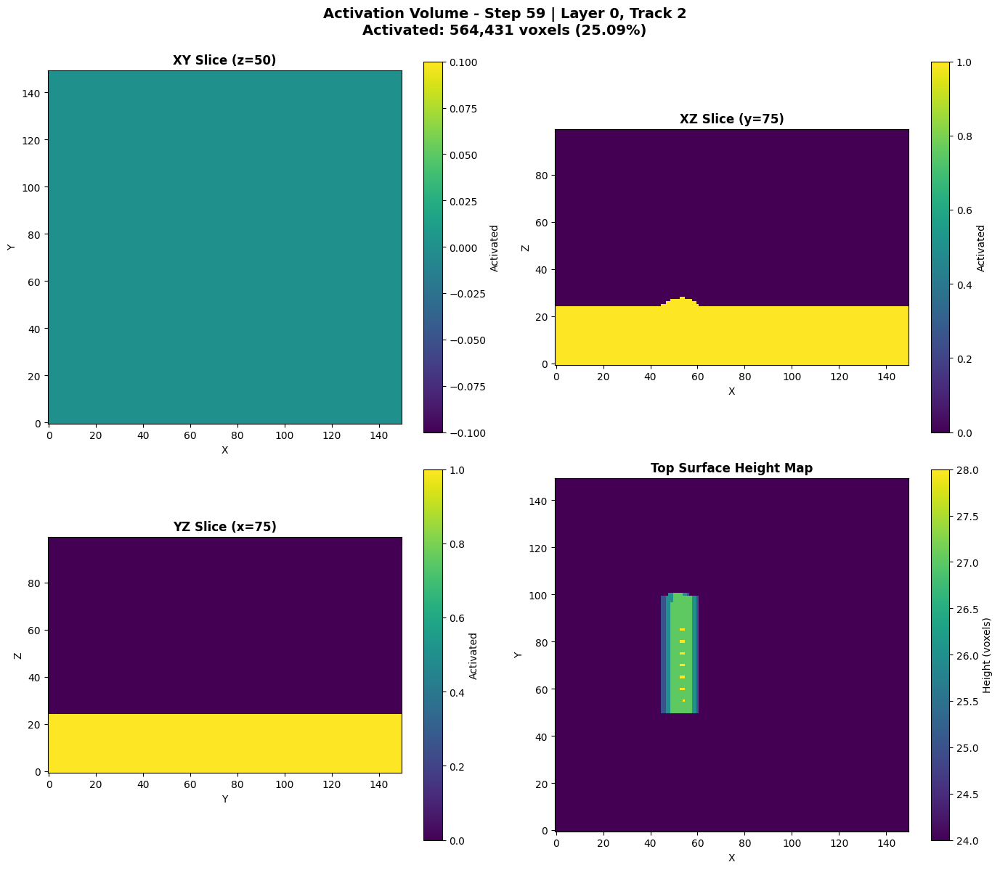

In [8]:
def visualize_activation_slices(filepath, step):
    """
    Visualize activation volume slices using existing plot_slice utility.
    
    Args:
        filepath: Path to activation HDF5 file
        step: Timestep to visualize
    """
    # Load data
    activation = load_activation_volume(str(filepath), step=step)
    metadata = load_activation_metadata(str(filepath), step=step)
    
    # Get middle indices
    nx, ny, nz = activation.shape
    mid_x = nx // 2
    mid_y = ny // 2
    mid_z = nz // 2
    
    # Create figure
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 12))
    
    # Plot slices using existing utility
    plot_slice(activation, index=mid_z, axis='z', ax=ax1,
              colorbar_kwargs={'label': 'Activated'})
    ax1.set_title(f'XY Slice (z={mid_z})', fontsize=12, fontweight='bold')
    
    plot_slice(activation, index=mid_y, axis='y', ax=ax2,
              colorbar_kwargs={'label': 'Activated'})
    ax2.set_title(f'XZ Slice (y={mid_y})', fontsize=12, fontweight='bold')
    
    plot_slice(activation, index=mid_x, axis='x', ax=ax3,
              colorbar_kwargs={'label': 'Activated'})
    ax3.set_title(f'YZ Slice (x={mid_x})', fontsize=12, fontweight='bold')
    
    # Plot top surface using existing utility
    plot_surface(activation, axis='z', from_top=True, ax=ax4,
                colorbar_kwargs={'label': 'Height (voxels)'})
    ax4.set_title('Top Surface Height Map', fontsize=12, fontweight='bold')
    
    # Overall title
    layer = metadata.get('layer', 'N/A')
    track = metadata.get('track', 'N/A')
    num_activated = metadata.get('num_activated', activation.sum())
    activation_frac = metadata.get('activation_fraction', activation.sum()/activation.size)
    
    fig.suptitle(
        f'Activation Volume - Step {step} | Layer {layer}, Track {track}\n'
        f'Activated: {num_activated:,} voxels ({activation_frac:.2%})',
        fontsize=14, fontweight='bold', y=0.995
    )
    
    plt.tight_layout()
    return fig

# Visualize activation slices
if activation_path.exists():
    step_to_plot = activation_steps[len(activation_steps)//2] if len(activation_steps) > 0 else activation_steps[0]
    
    fig = visualize_activation_slices(activation_path, step=step_to_plot)
    plt.show()

### 5.2 3D Interactive Visualization

In [9]:
def visualize_activation_3d(filepath, step, voxel_size=(2e-4, 2e-4, 2e-4), substrate_nz=None):
    """
    Create 3D interactive visualization using VoxelVisualizer.
    
    Args:
        filepath: Path to activation HDF5 file
        step: Timestep to visualize
        voxel_size: Voxel dimensions (meters)
        substrate_nz: Number of substrate layers (auto-detect if None)
    """
    # Load data
    activation = load_activation_volume(str(filepath), step=step)
    metadata = load_activation_metadata(str(filepath), step=step)
    
    # Get voxel size from metadata if available
    if 'voxel_size_x' in metadata:
        voxel_size = np.array([
            metadata['voxel_size_x'],
            metadata['voxel_size_y'],
            metadata['voxel_size_z']
        ])
    else:
        voxel_size = np.array(voxel_size)
    
    # Auto-detect substrate if not specified
    if substrate_nz is None:
        # Find first z-layer that's not fully activated
        for z in range(activation.shape[2]):
            if not activation[:, :, z].all():
                substrate_nz = z
                break
        else:
            substrate_nz = 0
    
    # Create visualizer
    viz = VoxelVisualizer(shape=activation.shape, voxel_size=voxel_size)
    
    # Create title with metadata
    layer = metadata.get('layer', 'N/A')
    track = metadata.get('track', 'N/A')
    num_activated = metadata.get('num_activated', activation.sum())
    title = f'Activation Volume - Step {step} | Layer {layer}, Track {track}'
    
    # Generate figure
    fig = viz.create_figure(
        activated=activation,
        substrate_nz=substrate_nz,
        title=title
    )
    
    return fig

# Create 3D visualization
if activation_path.exists():
    step_to_plot = activation_steps[-1]  # Visualize final step
    
    print(f"Creating 3D visualization for step {step_to_plot}...")
    fig = visualize_activation_3d(activation_path, step=step_to_plot)
    fig.show()

Creating 3D visualization for step 99...


### 5.3 Activation Growth Over Time

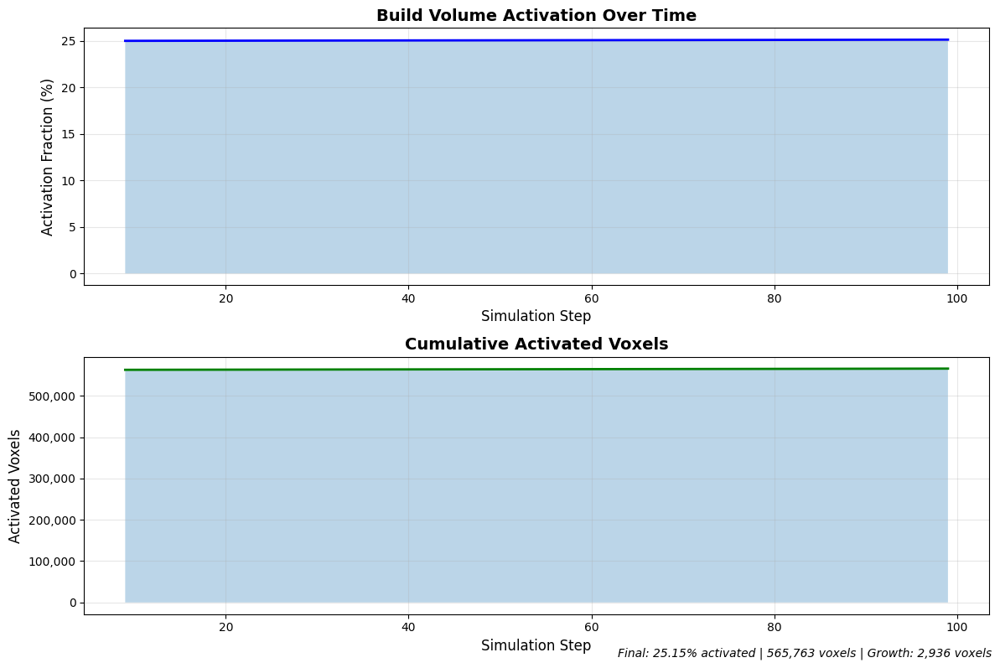

In [18]:
def plot_activation_evolution(filepath):
    """
    Plot activation statistics evolution using built-in utility.
    
    Args:
        filepath: Path to activation HDF5 file
    """
    # Get overall statistics
    stats = get_activation_statistics(str(filepath))
    
    steps = stats['steps']
    activation_fractions = stats['activation_per_step']
    num_activated = stats['num_activated_per_step']
    
    # Create plots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Activation fraction
    ax1.plot(steps, [f*100 for f in activation_fractions], 'b-', linewidth=2)
    ax1.set_xlabel('Simulation Step', fontsize=12)
    ax1.set_ylabel('Activation Fraction (%)', fontsize=12)
    ax1.set_title('Build Volume Activation Over Time', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.fill_between(steps, [f*100 for f in activation_fractions], alpha=0.3)
    
    # Number of activated voxels
    ax2.plot(steps, num_activated, 'g-', linewidth=2)
    ax2.set_xlabel('Simulation Step', fontsize=12)
    ax2.set_ylabel('Activated Voxels', fontsize=12)
    ax2.set_title('Cumulative Activated Voxels', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    ax2.fill_between(steps, num_activated, alpha=0.3)
    
    # Format y-axis with thousands separator
    ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
    
    # Add statistics
    final_fraction = stats.get('final_activation_fraction', 0)
    final_activated = stats.get('final_num_activated', 0)
    growth = stats.get('total_activated_growth', 0)
    
    fig.text(0.99, 0.01, 
             f"Final: {final_fraction*100:.2f}% activated | {final_activated:,} voxels | Growth: {growth:,} voxels",
             ha='right', va='bottom', fontsize=10, style='italic')
    
    plt.tight_layout()
    return fig

# Plot activation evolution
if activation_path.exists():
    fig = plot_activation_evolution(activation_path)
    plt.show()

## 6. Combined Thermal + Activation Visualization

Overlay thermal and activation data to see the relationship between temperature and solidification.

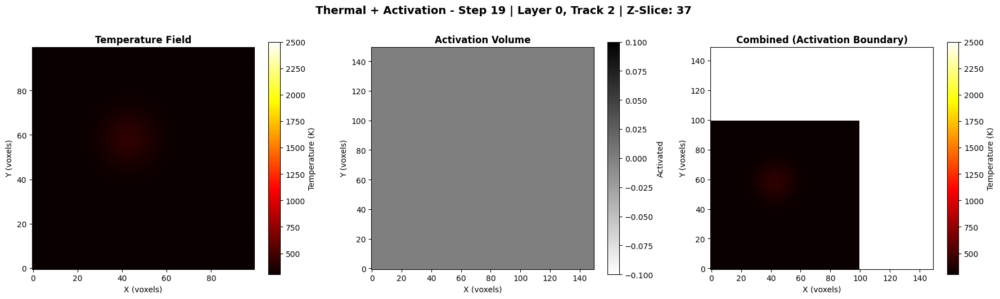

In [19]:
def visualize_thermal_activation_combined(thermal_path, activation_path, step):
    """
    Create combined visualization of thermal field and activation.
    
    Args:
        thermal_path: Path to thermal HDF5
        activation_path: Path to activation HDF5
        step: Timestep to visualize
    """
    # Load data
    temp_field = load_thermal_field(str(thermal_path), step=step)
    activation = load_activation_volume(str(activation_path), step=step)
    thermal_meta = load_thermal_metadata(str(thermal_path), step=step)
    
    # Get middle slice
    mid_z = temp_field.shape[2] // 2
    
    # Create figure
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
    
    # Temperature field (XY slice)
    temp_slice = temp_field[:, :, mid_z]
    im1 = ax1.imshow(temp_slice.T, origin='lower', cmap=COLORMAP, 
                     vmin=TEMP_RANGE[0], vmax=TEMP_RANGE[1])
    ax1.set_title('Temperature Field', fontsize=12, fontweight='bold')
    ax1.set_xlabel('X (voxels)')
    ax1.set_ylabel('Y (voxels)')
    plt.colorbar(im1, ax=ax1, label='Temperature (K)')
    
    # Activation (XY slice)
    activation_slice = activation[:, :, mid_z]
    im2 = ax2.imshow(activation_slice.T, origin='lower', cmap='gray_r')
    ax2.set_title('Activation Volume', fontsize=12, fontweight='bold')
    ax2.set_xlabel('X (voxels)')
    ax2.set_ylabel('Y (voxels)')
    plt.colorbar(im2, ax=ax2, label='Activated')
    
    # Combined: Activation boundary on temperature
    im3 = ax3.imshow(temp_slice.T, origin='lower', cmap=COLORMAP,
                     vmin=TEMP_RANGE[0], vmax=TEMP_RANGE[1])
    ax3.contour(activation_slice.T, levels=[0.5], colors='cyan', linewidths=2)
    ax3.set_title('Combined (Activation Boundary)', fontsize=12, fontweight='bold')
    ax3.set_xlabel('X (voxels)')
    ax3.set_ylabel('Y (voxels)')
    plt.colorbar(im3, ax=ax3, label='Temperature (K)')
    
    # Overall title
    layer = thermal_meta.get('layer', 'N/A')
    track = thermal_meta.get('track', 'N/A')
    fig.suptitle(f'Thermal + Activation - Step {step} | Layer {layer}, Track {track} | Z-Slice: {mid_z}',
                 fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    return fig

# Combined visualization
if thermal_path.exists() and activation_path.exists():
    # Find common step
    common_steps = set(thermal_steps) & set(activation_steps)
    if common_steps:
        step_to_plot = sorted(common_steps)[len(common_steps)//2]
        fig = visualize_thermal_activation_combined(thermal_path, activation_path, step_to_plot)
        plt.show()
    else:
        print("No common timesteps found between thermal and activation files")

## 7. Export Visualizations

Save high-quality figures for reports or publications.

In [20]:
def export_all_visualizations(thermal_path, activation_path, output_dir="visualizations"):
    """
    Export all visualizations to a directory.
    
    Args:
        thermal_path: Path to thermal HDF5
        activation_path: Path to activation HDF5
        output_dir: Directory to save figures
    """
    output_path = Path(output_dir)
    output_path.mkdir(exist_ok=True)
    
    print(f"Exporting visualizations to: {output_path}\n")
    
    # Get common steps
    thermal_steps_list = list_thermal_steps(str(thermal_path)) if thermal_path.exists() else []
    activation_steps_list = list_activation_steps(str(activation_path)) if activation_path.exists() else []
    
    # Export thermal evolution
    if thermal_path.exists() and len(thermal_steps_list) > 0:
        print("1. Exporting thermal evolution...")
        fig = plot_temperature_evolution(thermal_path, steps_to_sample=20)
        fig.savefig(output_path / 'thermal_evolution.png', dpi=300, bbox_inches='tight')
        plt.close(fig)
        print("   ✓ Saved: thermal_evolution.png")
    
    # Export activation evolution
    if activation_path.exists() and len(activation_steps_list) > 0:
        print("2. Exporting activation evolution...")
        fig = plot_activation_evolution(activation_path)
        fig.savefig(output_path / 'activation_evolution.png', dpi=300, bbox_inches='tight')
        plt.close(fig)
        print("   ✓ Saved: activation_evolution.png")
    
    # Export sample thermal field
    if thermal_path.exists() and len(thermal_steps_list) > 0:
        print("3. Exporting sample thermal field...")
        step = thermal_steps_list[len(thermal_steps_list)//2]
        fig = visualize_thermal_field(thermal_path, step=step, 
                                     melting_temp=MELTING_TEMP, 
                                     temp_range=TEMP_RANGE, 
                                     cmap=COLORMAP)
        fig.savefig(output_path / f'thermal_field_step_{step:04d}.png', dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"   ✓ Saved: thermal_field_step_{step:04d}.png")
    
    # Export sample activation slices
    if activation_path.exists() and len(activation_steps_list) > 0:
        print("4. Exporting sample activation slices...")
        step = activation_steps_list[len(activation_steps_list)//2]
        fig = visualize_activation_slices(activation_path, step=step)
        fig.savefig(output_path / f'activation_slices_step_{step:04d}.png', dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"   ✓ Saved: activation_slices_step_{step:04d}.png")
    
    # Export combined view
    common_steps = set(thermal_steps_list) & set(activation_steps_list)
    if common_steps:
        print("5. Exporting combined thermal+activation view...")
        step = sorted(common_steps)[len(common_steps)//2]
        fig = visualize_thermal_activation_combined(thermal_path, activation_path, step)
        fig.savefig(output_path / f'combined_step_{step:04d}.png', dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"   ✓ Saved: combined_step_{step:04d}.png")
    
    print(f"\n✓ All visualizations exported to: {output_path}")

# Export all
if thermal_path.exists() or activation_path.exists():
    export_all_visualizations(thermal_path, activation_path, output_dir="visualizations")

Exporting visualizations to: visualizations

1. Exporting thermal evolution...
Processing 4 timesteps...
  1/4
✓ Processed 4 timesteps
   ✓ Saved: thermal_evolution.png
2. Exporting activation evolution...
   ✓ Saved: activation_evolution.png
3. Exporting sample thermal field...


c:\Users\hakim\Documents\ma_feature_representation_env\git\hypo-simulations\utils\field_visualization.py:231: UserWarning:

The following kwargs were not used by contour: 'label'

c:\Users\hakim\Documents\ma_feature_representation_env\git\hypo-simulations\utils\field_visualization.py:464: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



   ✓ Saved: thermal_field_step_0014.png
4. Exporting sample activation slices...
   ✓ Saved: activation_slices_step_0059.png
5. Exporting combined thermal+activation view...
   ✓ Saved: combined_step_0019.png

✓ All visualizations exported to: visualizations


## 8. Summary and Statistics

In [21]:
def print_summary(thermal_path, activation_path):
    """Print comprehensive summary of simulation results."""
    print("\n" + "="*70)
    print("SIMULATION RESULTS SUMMARY")
    print("="*70 + "\n")
    
    # Thermal summary
    if thermal_path.exists():
        steps = list_thermal_steps(str(thermal_path))
        
        print("THERMAL DATA:")
        print(f"  File: {thermal_path}")
        print(f"  Timesteps saved: {len(steps)}")
        
        if len(steps) > 0:
            # First step
            temp_first = load_thermal_field(str(thermal_path), step=steps[0])
            meta_first = load_thermal_metadata(str(thermal_path), step=steps[0])
            
            # Last step
            temp_last = load_thermal_field(str(thermal_path), step=steps[-1])
            meta_last = load_thermal_metadata(str(thermal_path), step=steps[-1])
            
            print(f"  Grid shape: {temp_first.shape}")
            print(f"  Max temperature reached: {max(temp_first.max(), temp_last.max()):.1f} K")
            print(f"  Final layer: {meta_last.get('layer', 'N/A')}")
            print(f"  Final track: {meta_last.get('track', 'N/A')}")
    
    print()
    
    # Activation summary
    if activation_path.exists():
        stats = get_activation_statistics(str(activation_path))
        
        print("ACTIVATION DATA:")
        print(f"  File: {activation_path}")
        print(f"  Timesteps saved: {stats['num_steps']}")
        
        if stats['num_steps'] > 0:
            activation = load_activation_volume(str(activation_path), step=stats['steps'][0])
            
            print(f"  Grid shape: {activation.shape}")
            print(f"  Total voxels: {activation.size:,}")
            print(f"  Final activated: {stats.get('final_num_activated', 0):,} voxels")
            print(f"  Final activation fraction: {stats.get('final_activation_fraction', 0)*100:.2f}%")
            print(f"  Activation growth: {stats.get('total_activated_growth', 0):,} voxels")
    
    print("\n" + "="*70 + "\n")

# Print summary
print_summary(thermal_path, activation_path)


SIMULATION RESULTS SUMMARY

THERMAL DATA:
  File: test_hdf5\job1761060334374087600_build20.0x20.0x15.0mm_part5.0x5.0x2.0mm_vox200.0um_dt200.0ms_v3.0mms_p600.0W_f2.0gmin\thermal_fields.h5
  Timesteps saved: 4
  Grid shape: (100, 100, 75)
  Max temperature reached: 2156.1 K
  Final layer: 0
  Final track: 2

ACTIVATION DATA:
  File: video_prod\job1761097539539272700_build30.0x30.0x20.0mm_part10.0x10.0x5.0mm_vox200.0um_dt100.0ms_v5.0mms_p800.0W_f3.0gmin\activation_volumes.h5
  Timesteps saved: 10
  Grid shape: (150, 150, 100)
  Total voxels: 2,250,000
  Final activated: 565,763 voxels
  Final activation fraction: 25.15%
  Activation growth: 2,936 voxels




## 9. Notebook Complete!

You can now:
1. Re-run any cell to regenerate visualizations
2. Modify parameters (colormap, temperature range, etc.)
3. Export figures for reports
4. Analyze different timesteps

**Next Steps:**
- run with big experiment
- get ready for Termin am 04.11.2025
- Compare multiple simulation runs -> ###TODO: Maik sbatch file script